In [1]:
WIDTH = 320
HEIGHT = 240

IMAGE_W = 1920
IMAGE_H = 1080
WINDOW_W = 928
WINDOW_H = 696
WINDOW_X = (IMAGE_W - WINDOW_W) // 2
MAX_D = 101
ADDED_D = 4

ROOT_FOLDER = "D:/tensorflow-depth-estimation"

IMAGE_PATH = f"{ROOT_FOLDER}/video_utils/videos/video_1_cut/frame_00942.jpg"
# IMAGE_PATH = f"{ROOT_FOLDER}/video_utils/videos/video_1_cut/frame_00940.jpg"
# IMAGE_PATH = f"{ROOT_FOLDER}/video_utils/videos/video_1_cut/frame_01250.jpg"

EMPTY_ROAD_IMAGE = f"{ROOT_FOLDER}/video_utils/videos/video_1_cut/frame_00953.jpg"

MODEL_NAME = f"{ROOT_FOLDER}/model_kitti_unet_1709064377.keras"

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import random
import cv2

In [3]:
%run utils/datasets.ipynb

In [4]:
model = tf.keras.models.load_model(MODEL_NAME, compile=False) # only for prediction

1/1 [==============================] - 2s 2s/step


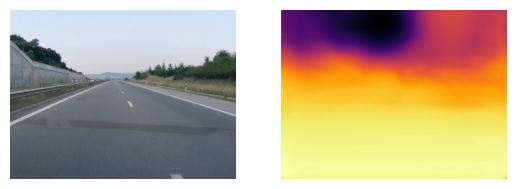

In [5]:
image = cv2.imread(EMPTY_ROAD_IMAGE)
image2 = image[:WINDOW_H, (IMAGE_W - WINDOW_W) // 2 : (IMAGE_W + WINDOW_W) // 2, :]
cv2.imwrite(f"{ROOT_FOLDER}/tmp.jpg", image2)

x_test = np.empty((1, HEIGHT, WIDTH, 3))
x_test[0, ] = preprocess_image(f"{ROOT_FOLDER}/tmp.jpg", HEIGHT, WIDTH, depth=False, horizontal_flip=False)

empty_road_prediction = model.predict(x_test, batch_size=1)
empty_road_prediction = empty_road_prediction[0]
empty_road_prediction = ADDED_D + empty_road_prediction * MAX_D

plt.subplot(1, 2, 1)
plt.axis("off")
img1 = preprocess_image(f"{ROOT_FOLDER}/tmp.jpg", HEIGHT, WIDTH, depth=False, horizontal_flip=False)
img1 = cv2.cvtColor((img1 * 255).astype(np.uint8), cv2.COLOR_BGR2RGB)
plt.imshow(img1)

plt.subplot(1, 2, 2)
plt.axis("off")
plt.imshow(empty_road_prediction, cmap=plt.get_cmap('inferno_r'))

In [6]:
image = cv2.imread(IMAGE_PATH)
image2 = image[:WINDOW_H, (IMAGE_W - WINDOW_W) // 2 : (IMAGE_W + WINDOW_W) // 2, :]
cv2.imwrite(f"{ROOT_FOLDER}/tmp.jpg", image2)

True

In [7]:
x_test = np.empty((1, HEIGHT, WIDTH, 3))
x_test[0, ] = preprocess_image(f"{ROOT_FOLDER}/tmp.jpg", HEIGHT, WIDTH, depth=False, horizontal_flip=False)

1/1 [==============================] - 0s 16ms/step


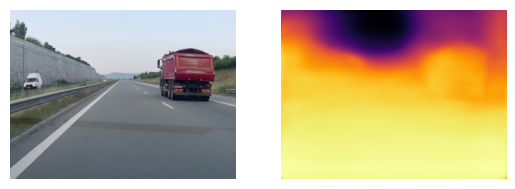

In [8]:
prediction = model.predict(x_test, batch_size=1)

prediction = prediction[0]

prediction = ADDED_D + prediction * MAX_D

plt.subplot(1, 2, 1)
plt.axis("off")
img1 = preprocess_image(f"{ROOT_FOLDER}/tmp.jpg", HEIGHT, WIDTH, depth=False, horizontal_flip=False)
img1 = cv2.cvtColor((img1 * 255).astype(np.uint8), cv2.COLOR_BGR2RGB)
plt.imshow(img1)

plt.subplot(1, 2, 2)
plt.axis("off")
plt.imshow(prediction, cmap=plt.get_cmap('inferno_r'))

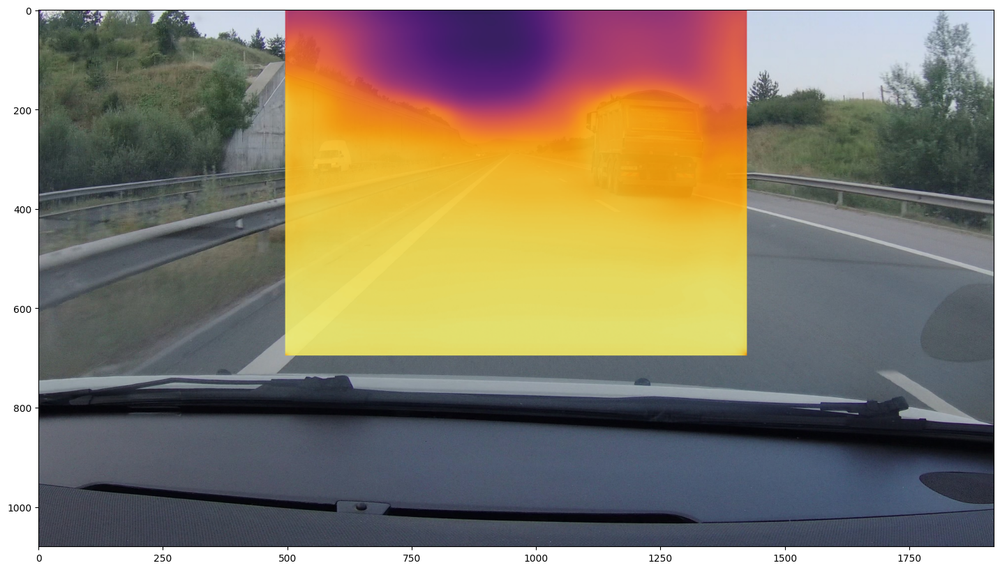

In [9]:
image_with_depth = image.copy()
heatmap = cv2.applyColorMap((255 - (prediction - ADDED_D) / MAX_D * 255).astype(np.uint8), cv2.COLORMAP_INFERNO)
heatmap2 = cv2.resize(heatmap, (WINDOW_W, WINDOW_H))
alpha = 0.1
image_with_depth[:WINDOW_H, (IMAGE_W - WINDOW_W) // 2 : (IMAGE_W + WINDOW_W) // 2] = \
    cv2.addWeighted(image_with_depth[:WINDOW_H, (IMAGE_W - WINDOW_W) // 2 : (IMAGE_W + WINDOW_W) // 2], alpha, heatmap2[:, :], 1 - alpha, 0)
plt.figure(figsize=(40,10))
plt.imshow(cv2.cvtColor(image_with_depth, cv2.COLOR_BGR2RGB))

In [10]:
def draw_distances(image, points):
    depth3 = image.copy()
    
    font = cv2.FONT_HERSHEY_SIMPLEX 
    font_scale = 0.7
    color = (255, 0, 0)
    thickness = 1
    
    find = points.copy()
    
    for h in range(200, 60, -1):
        for w in range(WIDTH):
            if find[h, w] > 128:
                dist = prediction[h, w, 0]
                text = f"{dist:.2f} m"
                text_size, _ = cv2.getTextSize(text, font, font_scale, thickness)
                text_pos = (int(WINDOW_H / HEIGHT * w - text_size[0] / 2 + WINDOW_X), int(WINDOW_H / HEIGHT * h))
                rectangle = np.ones((text_size[1] + 10, text_size[0] + 10, 3), np.uint8) * 255
                alpha = 0.5
                try:
                    depth3[text_pos[1] - 5 : text_pos[1] + text_size[1] + 5, text_pos[0] - 5 : text_pos[0] + text_size[0] + 5] = \
                        cv2.addWeighted(depth3[text_pos[1] - 5 : text_pos[1] + text_size[1] + 5, text_pos[0] - 5 : text_pos[0] + text_size[0] + 5], alpha, rectangle, 1 - alpha, 0)
                    depth3 = cv2.putText(depth3, text,
                                         (text_pos[0], text_pos[1] + text_size[1]), font,
                                         font_scale, color, thickness, cv2.LINE_AA)
                    t_w = int(HEIGHT / WINDOW_H * text_size[0])
                    t_h = int(HEIGHT / WINDOW_H * text_size[1])
                    find[max(0, h - t_h - 1) : min(h + t_h + 1, HEIGHT - 1), max(0, w - t_w - 1) : min(w + t_w + 1, WIDTH - 1)] = 0
                except:
                    pass
    plt.figure(figsize=(40,10))
    plt.imshow(cv2.cvtColor(depth3, cv2.COLOR_BGR2RGB), 'gray')

## Experiment 1. Empty Road Comparision

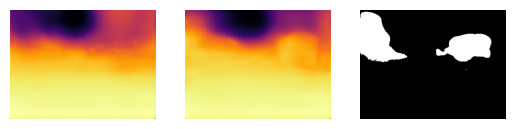

In [11]:
diff = empty_road_prediction[:,:,0] / prediction[:,:,0]

diff = diff > 1.25

plt.subplot(1, 3, 1)
plt.axis("off")
plt.imshow(empty_road_prediction, cmap=plt.get_cmap('inferno_r'))
plt.subplot(1, 3, 2)
plt.axis("off")
plt.imshow(prediction, cmap=plt.get_cmap('inferno_r'))
plt.subplot(1, 3, 3)
plt.axis("off")
plt.imshow(diff, 'gray')

115 214


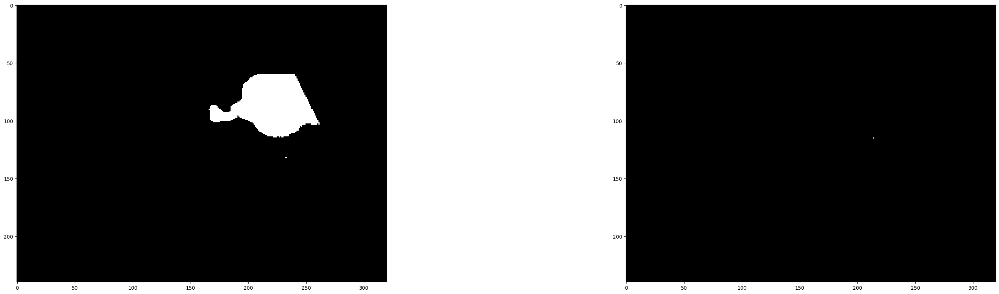

<Figure size 640x480 with 0 Axes>

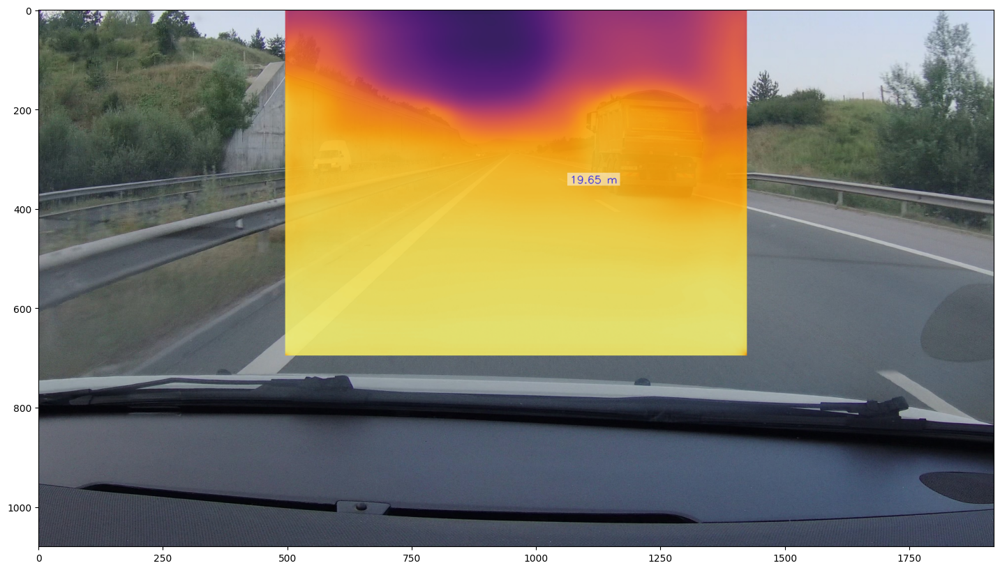

In [12]:
depth = np.zeros((HEIGHT, WIDTH), dtype=np.uint8)

for h in range(60, 230):
    for w in range(5, 315):
        if h < 220 and (w / (h - 220) > -0.9 or (WIDTH - w) / (h - 220) > -0.5):
            continue
        if diff[h, w]:
            depth[h, w] = 255

ret1, lab = cv2.connectedComponents(depth)

points = np.zeros((HEIGHT, WIDTH), dtype=np.uint8)

for i in range(1, ret1):
    component = np.zeros((HEIGHT, WIDTH), np.uint8)
    component[lab == i] = 255
    if np.count_nonzero(component) > 100:
        rect = cv2.boundingRect(component)
        points[rect[1] + rect[3], rect[0] + rect[2] // 2] = 255
        print(rect[1] + rect[3], rect[0] + rect[2] // 2)

plt.figure(figsize=(40,10))
plt.subplot(1, 2, 1)
plt.imshow(depth, 'gray')
plt.subplot(1, 2, 2)
plt.imshow(points, 'gray')
plt.figure()
draw_distances(image_with_depth, points)

## Experiment 2. Canny Edge over Depth Image

(696, 928, 3) (240, 320)
Object at (209, 58) with width 17, height 7 and median depth 96.0
Object at (66, 53) with width 51, height 14 and median depth 149.5
Object at (0, 0) with width 18, height 12 and median depth 155.5


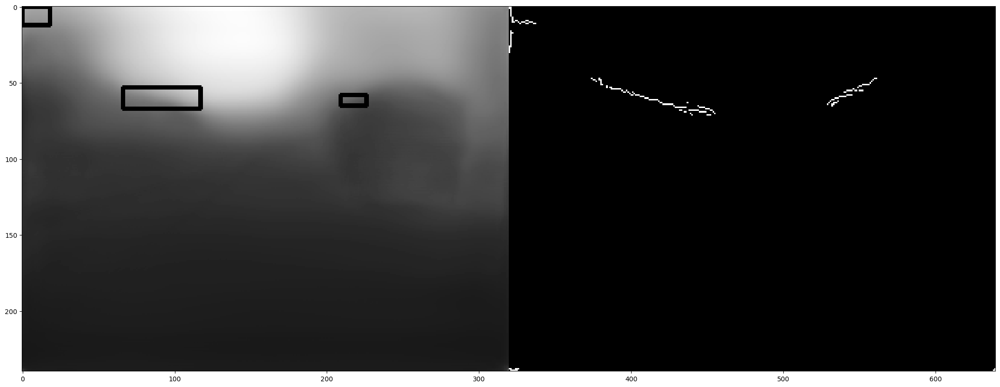

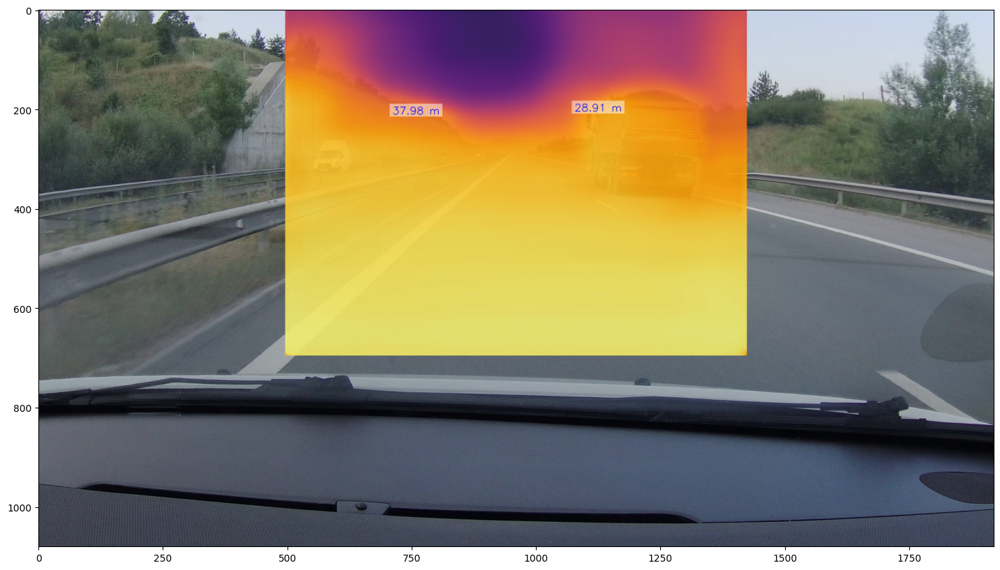

In [13]:
normalized = ((prediction / np.max(prediction)) * 255).astype(np.uint8)
normalized = normalized[:, :, 0]

print(image2.shape, normalized.shape)

edges = cv2.Canny(normalized, 10, 50)

# Find contours in the edge-detected image
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

points = np.zeros((HEIGHT, WIDTH), dtype=np.uint8)

# Iterate through detected contours
for contour in contours:
    # Compute the bounding box of the contour
    x, y, w, h = cv2.boundingRect(contour)

    if w * h < 100:
        continue
    
    # Extract the depth values from the bounding box region
    depth_values = normalized[y:y+h, x:x+w]
    
    # Compute the median depth value
    median_depth = np.median(depth_values)
    
    # Print the coordinates of the bounding box and the median depth value
    print(f"Object at ({x}, {y}) with width {w}, height {h} and median depth {median_depth}")
    points[y + h, x + w // 2] = 255

    # Optionally, you can draw the bounding box on the original depth image
    cv2.rectangle(normalized, (x, y), (x+w, y+h), (0, 255, 0), 2)

# Display the results
plt.figure(figsize=(40,10))
plt.imshow(np.concatenate((normalized, edges), axis=1), 'gray')
draw_distances(image_with_depth, points)

## Experiment 3. Canny Edge over Grayscale Image

(696, 928, 3) (240, 320)
Object at (7, 106) with width 144, height 134 and median depth 109.0
Object at (0, 97) with width 155, height 128 and median depth 110.0
225 77
Object at (177, 55) with width 143, height 58 and median depth 106.0
113 248


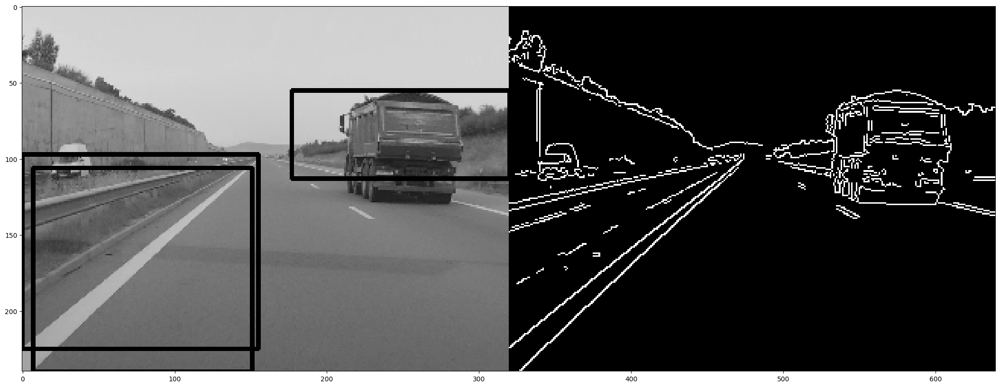

<Figure size 640x480 with 0 Axes>

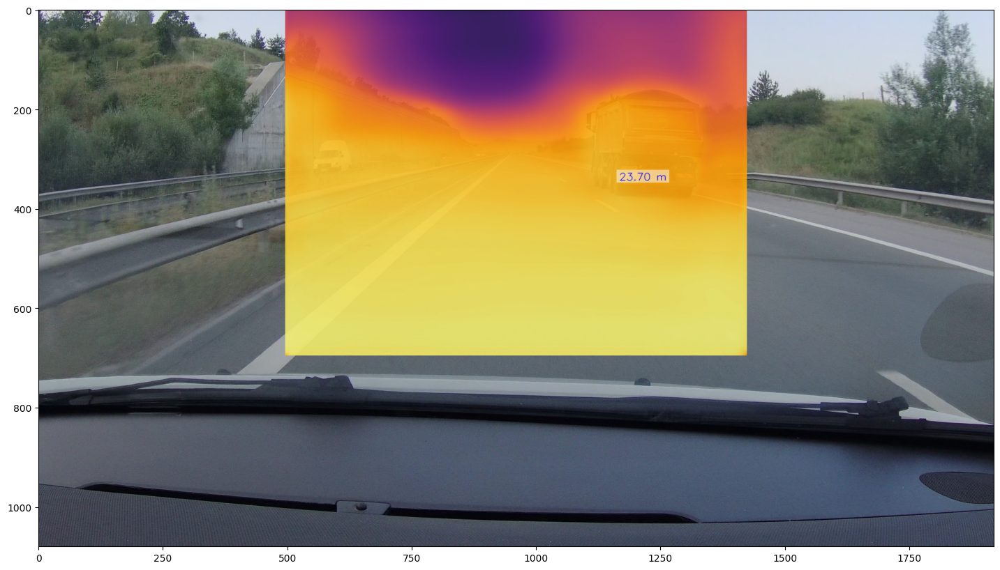

In [14]:
normalized = ((prediction / np.max(prediction)) * 255).astype(np.uint8)

normalized = cv2.resize(cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY), (320, 240))

print(image2.shape, normalized.shape)

edges = cv2.Canny(normalized, 140, 200)

# Find contours in the edge-detected image
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

points = np.zeros((HEIGHT, WIDTH), dtype=np.uint8)

# Iterate through detected contours
for contour in contours:
    # Compute the bounding box of the contour
    x, y, w, h = cv2.boundingRect(contour)

    if w * h < 5000:
        continue
    
    # Extract the depth values from the bounding box region
    depth_values = normalized[y:y+h, x:x+w]
    
    # Compute the median depth value
    median_depth = np.median(depth_values)
    
    # Print the coordinates of the bounding box and the median depth value
    print(f"Object at ({x}, {y}) with width {w}, height {h} and median depth {median_depth}")
    if y + h < 240 and x + w // 2 < 320:
        print(y + h, x + w // 2)
        points[y + h, x + w // 2] = 255
    

    # Optionally, you can draw the bounding box on the original depth image
    cv2.rectangle(normalized, (x, y), (x+w, y+h), (0, 255, 0), 2)

# Display the results
plt.figure(figsize=(40,10))
plt.imshow(np.concatenate((normalized, edges), axis=1), 'gray')
plt.figure()
draw_distances(image_with_depth, points)

## Experiment 4. Mask R-CNN

Object at (205, 57) with width 84, height 73 and median depth 89.0
130 247
Object at (205, 53) with width 83, height 76 and median depth 88.0
129 246


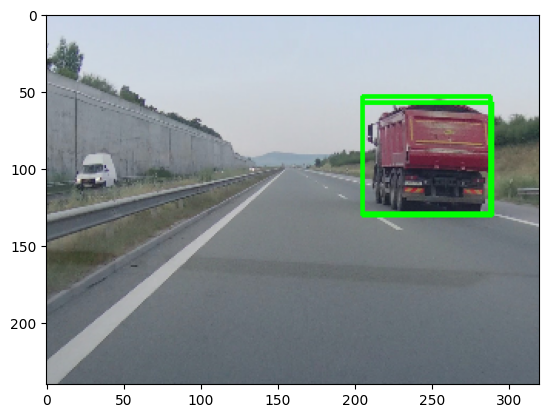

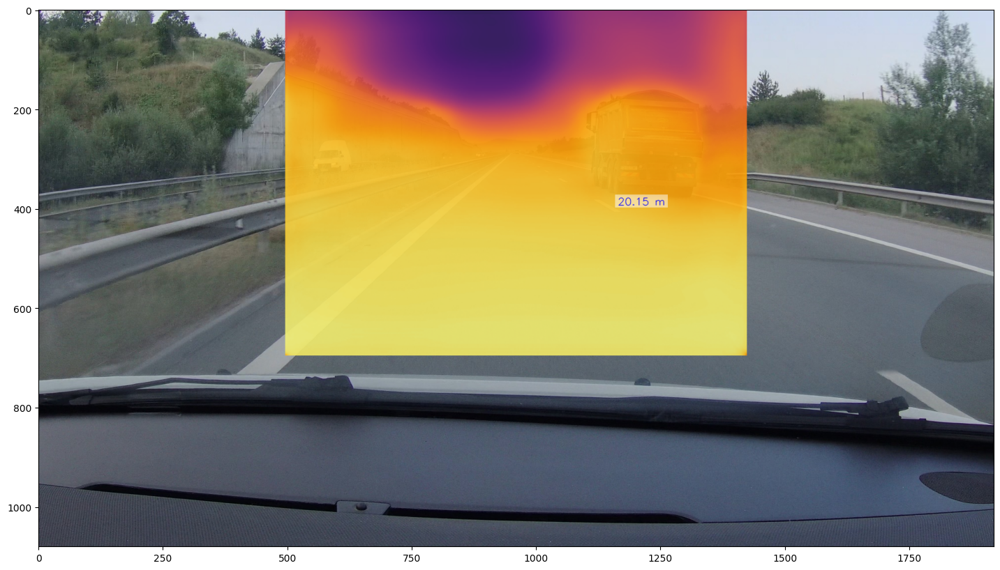

In [15]:
net = cv2.dnn.readNetFromTensorflow('mask_rcnn_inception_v2_coco_2018_01_28.pb', 'mask_rcnn_inception_v2_coco_2018_01_28.pbtxt')

normalized = cv2.resize(image2.copy(), (320, 240))

# Prepare the depth image for inference
blob = cv2.dnn.blobFromImage(normalized, swapRB=True, crop=False)
net.setInput(blob)

# Perform object detection
boxes, masks = net.forward(["detection_out_final", "detection_masks"])

points = np.zeros((HEIGHT, WIDTH), dtype=np.uint8)

# Iterate through the detected objects
for i in range(boxes.shape[2]):
    confidence = boxes[0, 0, i, 2]
    if confidence > 0.5:  # Filter out weak detections
        class_id = int(boxes[0, 0, i, 1])
        
        if class_id != 0:  # We only consider non-background classes
            # Extract the bounding box coordinates
            box = boxes[0, 0, i, 3:7] * np.array([320, 240, 320, 240])
            x1, y1, x2, y2 = box.astype(int)
            w = x2 - x1
            h = y2 - y1
            
            # Extract the depth values from the bounding box region
            depth_values = normalized[y1:y2, x1:x2]
            
            # Compute the median depth value
            median_depth = np.median(depth_values)
            
            # Print the coordinates of the bounding box and the median depth value
            print(f"Object at ({x1}, {y1}) with width {w}, height {h} and median depth {median_depth}")

            points[y1 + h, x1 + w // 2] = 255
            print(y1 + h, x1 + w // 2)
            
            # Optionally, you can draw the bounding box on the original depth image
            cv2.rectangle(normalized, (x1, y1), (x2, y2), (0, 255, 0), 2)

# Display the results
plt.imshow(cv2.cvtColor(normalized, cv2.COLOR_BGR2RGB))
draw_distances(image_with_depth, points)

## Experiment 5. Template Matching

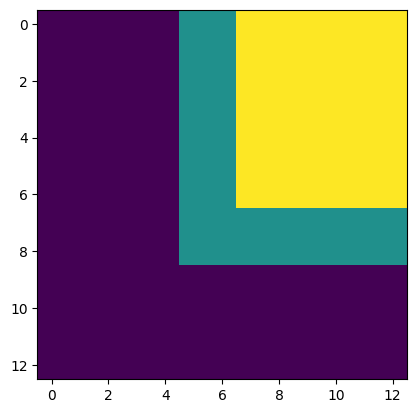

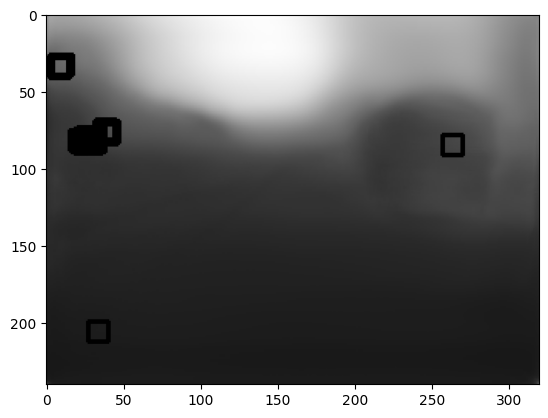

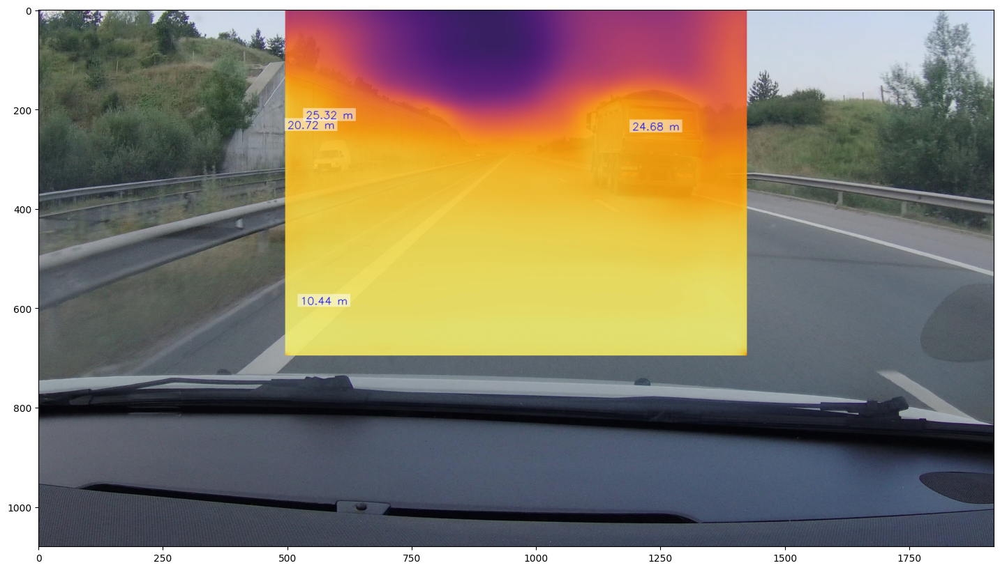

In [16]:
normalized = ((prediction / np.max(prediction)) * 255).astype(np.uint8)

# Load the template image (e.g., a template of the object you want to detect)
template = np.zeros((13, 13), np.uint8)
template[:, :] = 64
template[:9, 5:] = 128
template[:7, 7:] = 192

# Perform template matching
result = cv2.matchTemplate(normalized, template, cv2.TM_CCOEFF_NORMED)

# Set a threshold for the match score
threshold = 0.85

# Locate where the template matches exceed the threshold
locations = np.where(result >= threshold)

points = np.zeros((HEIGHT, WIDTH), dtype=np.uint8)

# Iterate through the matched locations
for pt in zip(*locations[::-1]):
    # Extract the coordinates of the matched region
    x, y = pt
    
    # Compute the width and height of the template
    h, w = template.shape
    
    # Extract the depth values from the matched region
    depth_values = normalized[y:y+h, x:x+w]
    
    # Compute the median depth value
    median_depth = np.median(depth_values)
    
    # Print the coordinates of the matched region and the median depth value
    #print(f"Object detected at ({x}, {y}) with width {w}, height {h} and median depth {median_depth}")

    points[y, x] = 255
    # Optionally, you can draw rectangles around the matched regions on the original depth image
    cv2.rectangle(normalized, (x, y), (x+w, y+h), (0, 255, 0), 2)

# Display the results
plt.imshow(template)
plt.figure()
plt.imshow(cv2.cvtColor(normalized, cv2.COLOR_BGR2RGB))
draw_distances(image_with_depth, points)

## Experiment 6. Template 2 Matching

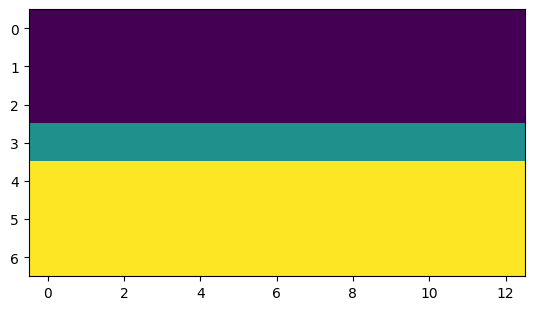

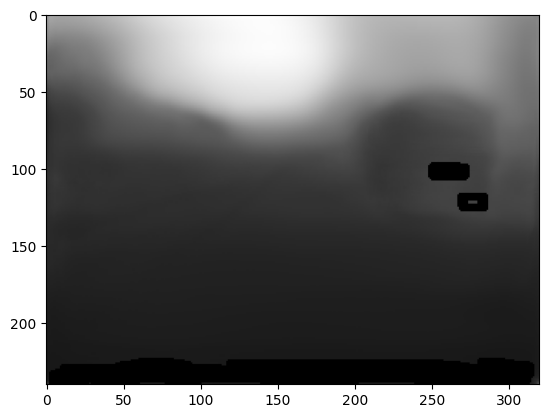

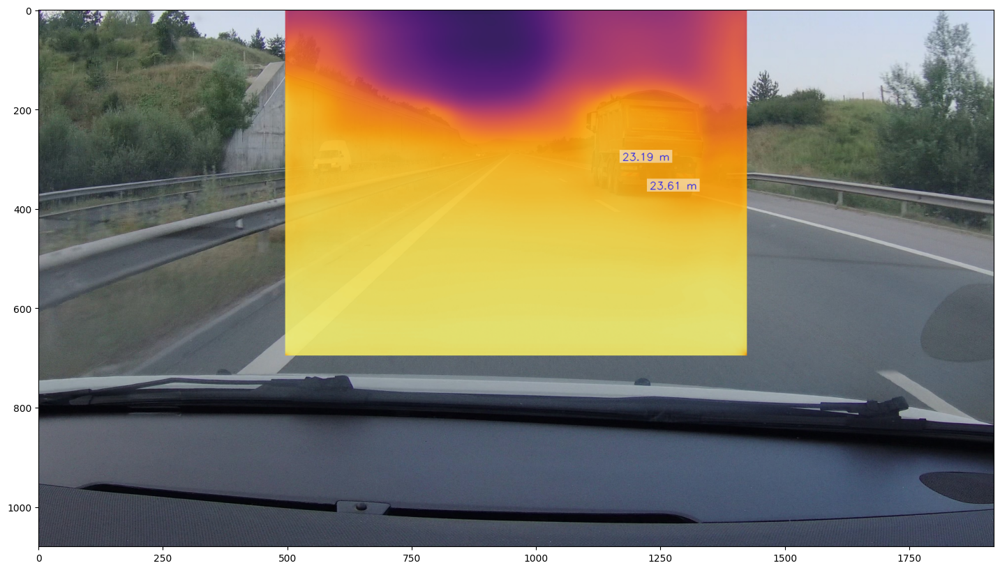

In [17]:
normalized = ((prediction / np.max(prediction)) * 255).astype(np.uint8)

# Load the template image (e.g., a template of the object you want to detect)
template = np.zeros((7, 13), np.uint8)
template[0:3,:] = 64
template[3,:] = 128
template[4:,:] = 192

# Perform template matching
result = cv2.matchTemplate(normalized, template, cv2.TM_CCOEFF_NORMED)

# Set a threshold for the match score
threshold = 0.8

# Locate where the template matches exceed the threshold
locations = np.where(result >= threshold)

points = np.zeros((HEIGHT, WIDTH), dtype=np.uint8)

# Iterate through the matched locations
for pt in zip(*locations[::-1]):
    # Extract the coordinates of the matched region
    x, y = pt
    
    # Compute the width and height of the template
    h, w = template.shape
    
    # Extract the depth values from the matched region
    depth_values = normalized[y:y+h, x:x+w]
    
    # Compute the median depth value
    median_depth = np.median(depth_values)
    
    # Print the coordinates of the matched region and the median depth value
    #print(f"Object detected at ({x}, {y}) with width {w}, height {h} and median depth {median_depth}")

    points[y, x] = 255
    # Optionally, you can draw rectangles around the matched regions on the original depth image
    cv2.rectangle(normalized, (x, y), (x+w, y+h), (0, 255, 0), 2)

# Display the results
plt.imshow(template)
plt.figure()
plt.imshow(cv2.cvtColor(normalized, cv2.COLOR_BGR2RGB))
draw_distances(image_with_depth, points)